In [ ]:
###### Before starting install the following packages : pip install git+https://github.com/tensorflow/examples.git

# Image Colorization Project, Cross-Entropy

In this notebook, our objective is to correctly colorize black and white images. We propose to do this by framing the task as a classification problem, where given the values of the luminance channel of the picture, we quantize the AB space, and then try to correctly classify each pixel, assigning it to the correct quantized value, and then reconstruct the image by mapping the picture to RGB for visualization. <br>
To carry out this task, we use the Cross Entropy Loss, and to mitigate the problems of unbalance between pixel color representation in the dataset, we also implement a weighting for the loss function. <br>
We develop our analysis on the People dataset, which is descriibed extensively in the MSE.ipynb file. <br>
The methods we use in this notebook were inspired by the paper: "Colorful Image Colorization" by Zhang et al. so we will not go into much detail about the technicalities of their methods, which can be found on their paper.

In [19]:
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np
import tqdm as tqdm
from scipy.ndimage import gaussian_filter
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping
from Functions.DataLoader import data_generator, weighted_data_generator
from Models.MSE_model import buildresnet_model, buildresnet_from_weights
from Functions.Visualization import visualize_predictions
from Functions.Quantization import buildcanvas, create_weights, flatten_weights, build_index

In [20]:
data_dir = 'Data/PEOPLE'

# AB Channel Quantization

In this section, we describe how we perform the quantization process. <br>
We build a 25x25 grid of quantized bins for the AB channels, where each grid tile has size 10x10, and if a pixel has AB channel values $[x, y]$, we map the pixel to the bin [y//10, x//10]. <br>
First, we get a probability distribution on the bins by mapping each pixel of each image in the directory into its corresponding bin, and then computing the frequency of each bin and extracting the relative empirical probability. We then use this distribution on the quantized bins to obtain a matrix of weights which is inversely proportional to the probability of the bin, in order to account for color unbalance in the dataset and give more weight to unlikely colors.



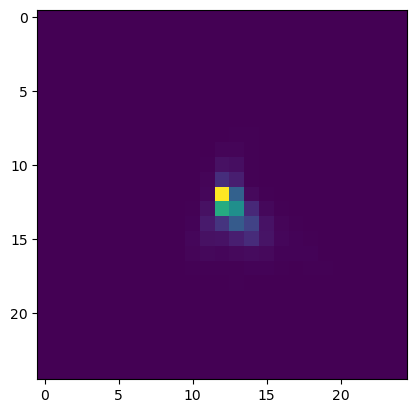

In [3]:
data_dir = 'Data/PEOPLE'
canvas, p = buildcanvas(data_dir)
plt.imshow(canvas)

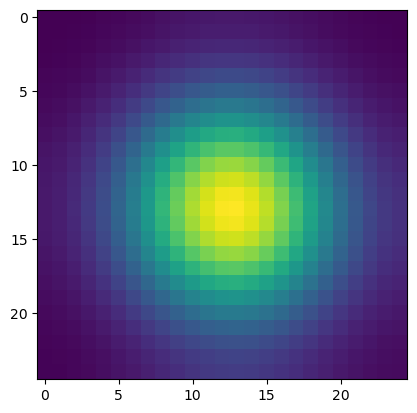

In [7]:
p_tilde = gaussian_filter(p, sigma=5)
plt.imshow(p_tilde) # smoothed probability distribution

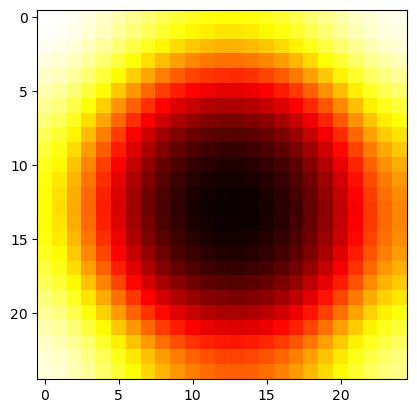

In [8]:
w = create_weights(p_tilde) # weight vector
plt.imshow(w, cmap = 'hot')

As we can see, the pixels which have pixel values in the range [100, 150]x[100, 150] (which corresponds to the range [10, 15]x[10, 15] in the quantized space) appeared very very frequently in the dataset, so the p matrix has a high peak in these regions. We can also see that the weight matrix has low weight values in that region (black part of the weight graph), precisely to account for frequency unbalance.

We can also notice from the plot of p that many of the bins have probability zero, which means that across the whole dataset, there was no pixel with AB channel values corresponding to that bin. This is because some combinations of A and B channel are extremely unlikely, therefore we remove such bins from our prediction, and restrict the labels to the bins which have nonzero probability in the dataset. This allows us to reduce the number of labels from 25x25 (625) to only 243. <br>
Since we will not use all the bins in the matrix, we decide to flatten the matrix and only retain the bins with nonzero probability, and to easily switch between matrix and reduced vector notation, we build two dictionaries called *index_map* and *inverse_index_map*.

In [21]:
# Running the cells above takes time, so their execution can be skipped
canvas = np.load('quantization_files/people_canvas.npy')
w = np.load('quantization_files/people_weight_matrix.npy')
p = canvas/np.sum(canvas)

In [22]:
index_map, inverse_index_map = build_index(canvas)
w_vector = flatten_weights(inverse_index_map, w)
w_vector.shape

(243,)

# Preprocessing and Data Loader

To train the model we use a data generator which we defined, and that can be found in the *Functions* subdirectory. <br>
This function extracts some pictures from the data directory, converts them from RGB to LAB format, splits the channels and builds the X and y matrices that will be used in training. Furthermore, it casts them into the appropriate shapes required by the Neural Network.

The **data_generator** function takes as input 6 parameters:
- the data directory (data_dir) from which to extract the pictures
- the batch size (in our notebooks, set to 32)
- the start index in the data directory and the size of the set from which to select the images (i.e. if the start index is 0 and the size is 32000, the dataloader will output images taken from data_dir, between the 0-th and the 32000-th image)
- the height and width of the images (since images have various sizes in the dataset, we resize them to our desired size)

The data is returned as a tuple of objects, where the first entry is the X set, while the second is the y set, in the correct shape to feed them into the Neural Network.

In [23]:
height, width = 224, 224
train_data = weighted_data_generator(data_dir, 32, 0, 1000, height, width, inverse_index_map, w_vector)
val_data = weighted_data_generator(data_dir, 32, 1000, 200, height, width, inverse_index_map, w_vector)
print(f'Shape of X set: {next(train_data)[0].shape}\nShape of y set: {next(train_data)[1].shape}')

Shape of X set: (32, 224, 224, 3)
Shape of y set: (32, 224, 224, 1)


Both the X and y set contain 32 images, and for each image we have 224x224 pixels. The X set has 3 channels per pixel, which are simply the L channel (luminance) repeated 3 times to obtain an RGB black and white image to feed to the pretrained network we will use. <br>
The y set instead has 1 channels per pixel, because for each pixel we input the label corresponding to that pixel. 

# Model Definition

In this short subsection, we call a function defined in the "Models" subdirectory, which essentially builds the resnet model given an input size and the number of output channels. <br>
The model is composed of 2 different blocks: one encoder and one decoder, with encoding layers connected to decoding layers with skip connects, effectively imitating a UNet architecture. <br>
The encoder part of the network is a ResNet50 model pretrained on the ImageNet dataset, while the decoder part was implemented by us using some upsampling blocks imported from the pix2pix Github directory. Finally, we added a transpose convolutional layer with two output channels at the end, in order to get two 224x224 predictions (one for the A and one for the B channel). 

In [24]:
resnet_model = buildresnet_model([224,224, 3], 243)
resnet_model.summary()

Model: "functional_23"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_13      │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_17       │ [(None, 112, 112, │ 23,587,712 │ input_layer_13[0… │
│ (Functional)        │ 64), (None, 56,   │            │                   │
│                     │ 56, 256), (None,  │            │                   │
│                     │ 28, 28, 512),     │            │                   │
│                     │ (None, 14, 14,    │            │                   │
│                     │ 1024), (None, 7,  │            │                   │
│                     │ 7, 2048)]         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_8        │ (None, 14, 14,    │  9,439,232 │ functional_17[0]… │
│ (Sequential)        │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_8       │ (None, 14, 14,    │          0 │ sequential_8[0][… │
│ (Concatenate)       │ 1536)             │            │ functional_17[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_9        │ (None, 28, 28,    │  3,539,968 │ concatenate_8[0]… │
│ (Sequential)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_9       │ (None, 28, 28,    │          0 │ sequential_9[0][… │
│ (Concatenate)       │ 768)              │            │ functional_17[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_10       │ (None, 56, 56,    │    885,248 │ concatenate_9[0]… │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_10      │ (None, 56, 56,    │          0 │ sequential_10[0]… │
│ (Concatenate)       │ 384)              │            │ functional_17[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_11       │ (None, 112, 112,  │    221,440 │ concatenate_10[0… │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_11      │ (None, 112, 112,  │          0 │ sequential_11[0]… │
│ (Concatenate)       │ 128)              │            │ functional_17[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose_14 │ (None, 224, 224,  │    280,179 │ concatenate_11[0… │
│ (Conv2DTranspose)   │ 243)              │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 37,953,779 (144.78 MB)

 Trainable params: 14,364,147 (54.79 MB)

 Non-trainable params: 23,589,632 (89.99 MB)

Here, we want 243 output channels, so that for each pixel we get a 243 dimensional vector as output, which will contain the logits we will use to extract the predicted probability distribution over the labels.

# Model Training and Finetuning

In the following cell, we show the code we used to perform the training of our models. <br>
Once again, the computational cost of training such models was too high for us to sustain on a PC, and therefore we performed the computations on a server. Nonetheless, we present the code we used to perform the training.

In [ ]:
data_dir = 'Data/PEOPLE'
train_data = weighted_data_generator(data_dir, 32, 0, 1000, height, width, inverse_index_map, w_vector)
val_data = weighted_data_generator(data_dir, 32, 1000, 200, height, width, inverse_index_map, w_vector)

resnet_model.compile(optimizer='adam', loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True))
early_stopping = EarlyStopping(monitor='val_loss',
                                   patience = 5,
                                   mode='min',
                                   verbose=1,
                                   min_delta=0.1)

history = resnet_model.fit(train_data,
                    epochs = 100,
                    steps_per_epoch = 31,   
                    validation_data = val_data,
                    validation_steps = 6,    
                    callbacks = [early_stopping],
                    verbose = 1)

This time, we do not perform any finetuning, since it was too costly even on the server.

# Model Evaluation

In this section, we present the only model we trained with this custom loss. More specifically, the model was trained on 1000 images from the People dataset, and to evaluate the quality of its performance we once again rely on our perception of the pictures instead of the numerical value of the cross entropy loss of the models. <br>
In the next few cells we will plot some images which will be divided in 3 columns, where the first will be the original image, the second will be the grayscale image, and the third will be the predicted image. <br>
We also point out that, given a probability distribution on the quantized bins returned by the model, we can obtain many different versions of the predicted images, depending on how we decide to exploit the distribution on each pixel. For instance, taking inspiration from what Zhang et al. did in their paper, we introduce a **Temperature** parameter, which we can regulate to modify how we extract the values of the AB channels from the distribution. The formulas of this specific step can be found on Zhang et al.'s paper, and can also be seen in our Visualization.py file.

In [25]:
model = buildresnet_from_weights((224, 224, 3), 243, False, 'TrainedModels/224_loss_people_model.weights.h5')

## Evaluation on PEOPLE

In [26]:
evaluation_data = data_generator('Data/TEST_DATA/PEOPLE_TEST', 10, 0, 10, 224, 224)
data = next(evaluation_data)
predictions = model.predict(data[0])

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


We show in the following few cells different predictions with different temperatures, starting from T = 0.05 and going up to T = 1

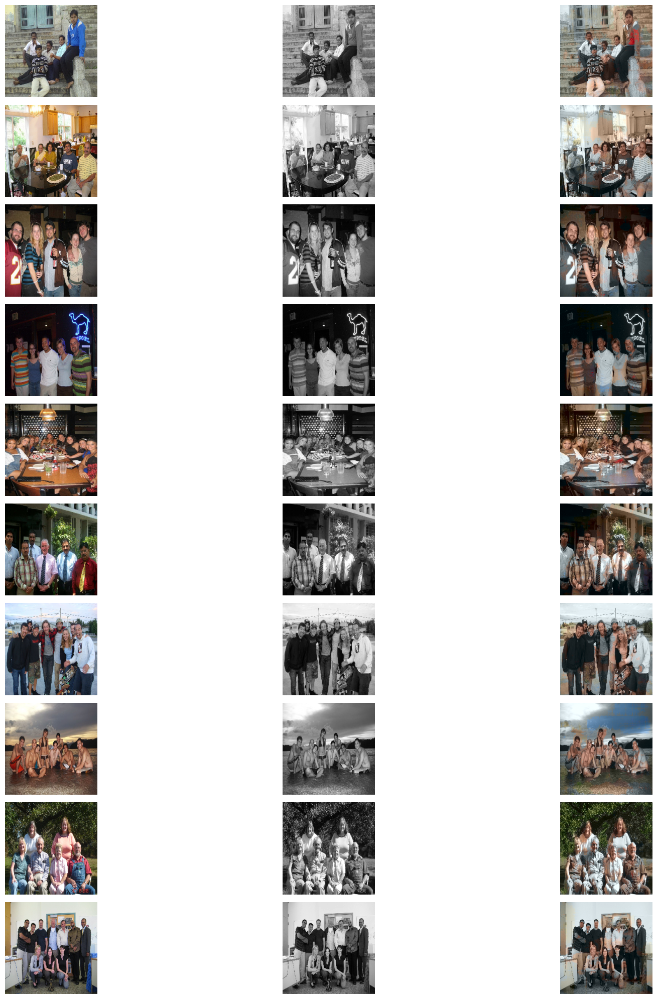

In [27]:
visualize_predictions(data, predictions, 0.05, 224, 224, index_map)

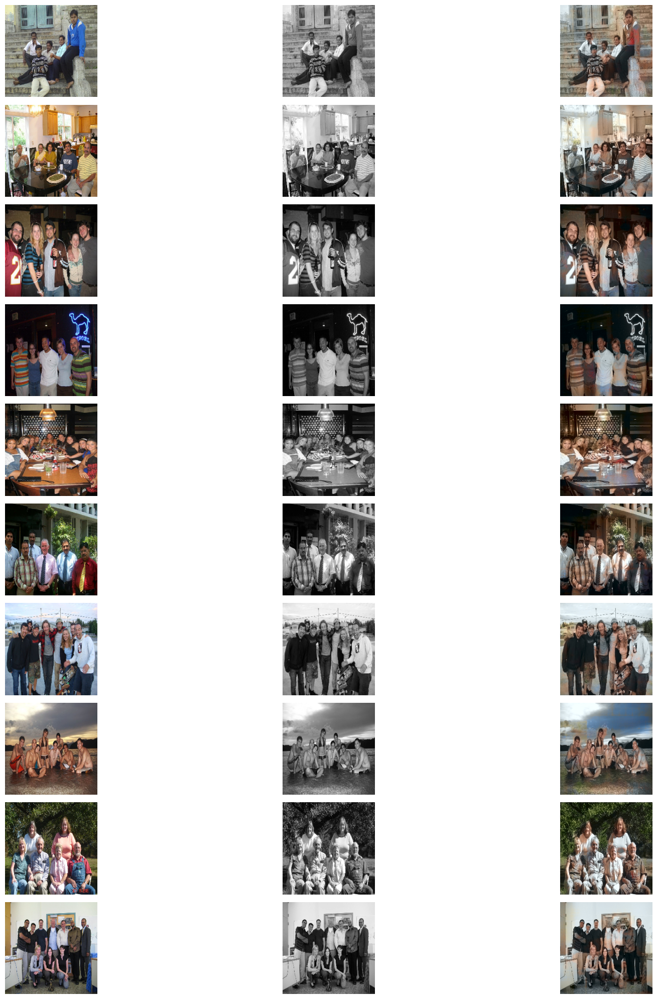

In [28]:
visualize_predictions(data, predictions, 0.4, 224, 224, index_map)

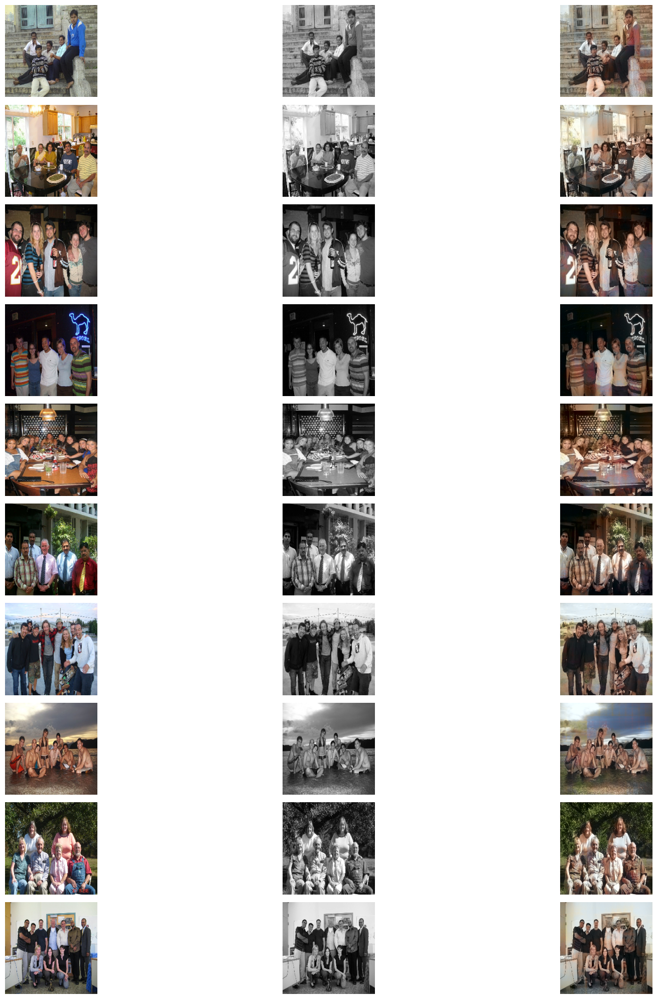

In [29]:
visualize_predictions(data, predictions, 1, 224, 224, index_map)

## Evaluation on Historical Images

In [30]:
evaluation_data = data_generator('Data/TEST_DATA/historical', 10, 0, 10, 224, 224)
data = next(evaluation_data)
predictions1 = model.predict(data[0])

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


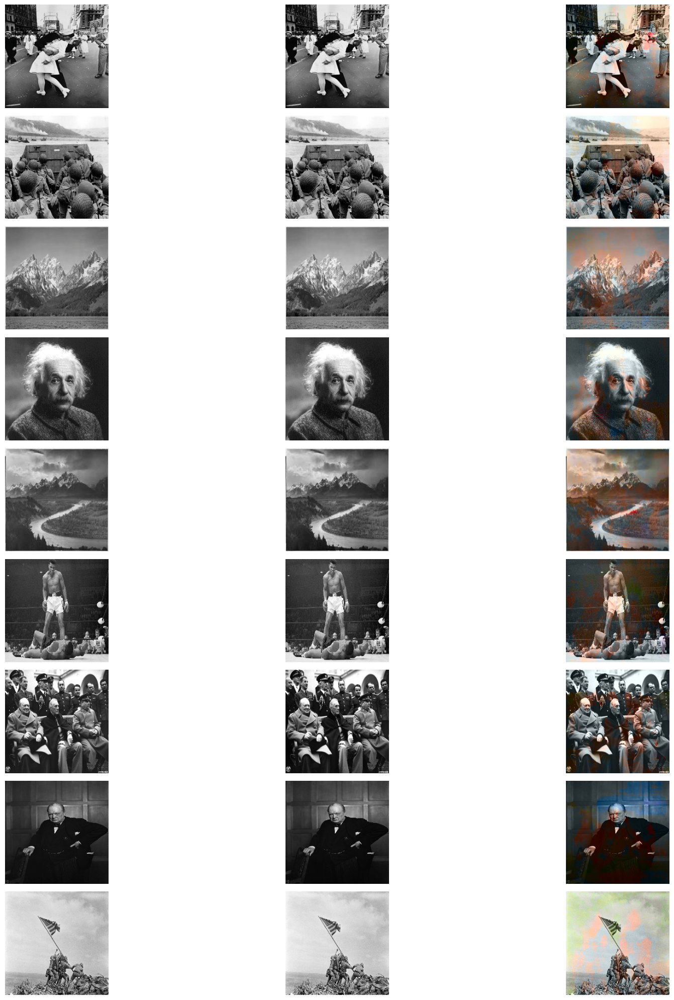

In [31]:
visualize_predictions(data, predictions, 0.05, 224, 224, index_map)

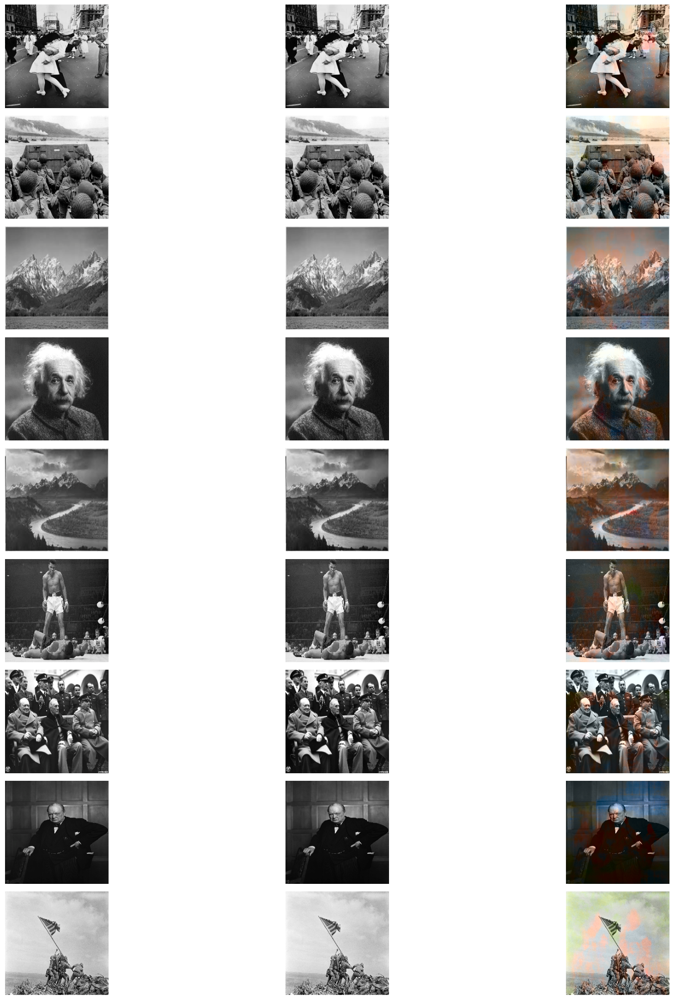

In [32]:
visualize_predictions(data, predictions, 0.4, 224, 224, index_map)

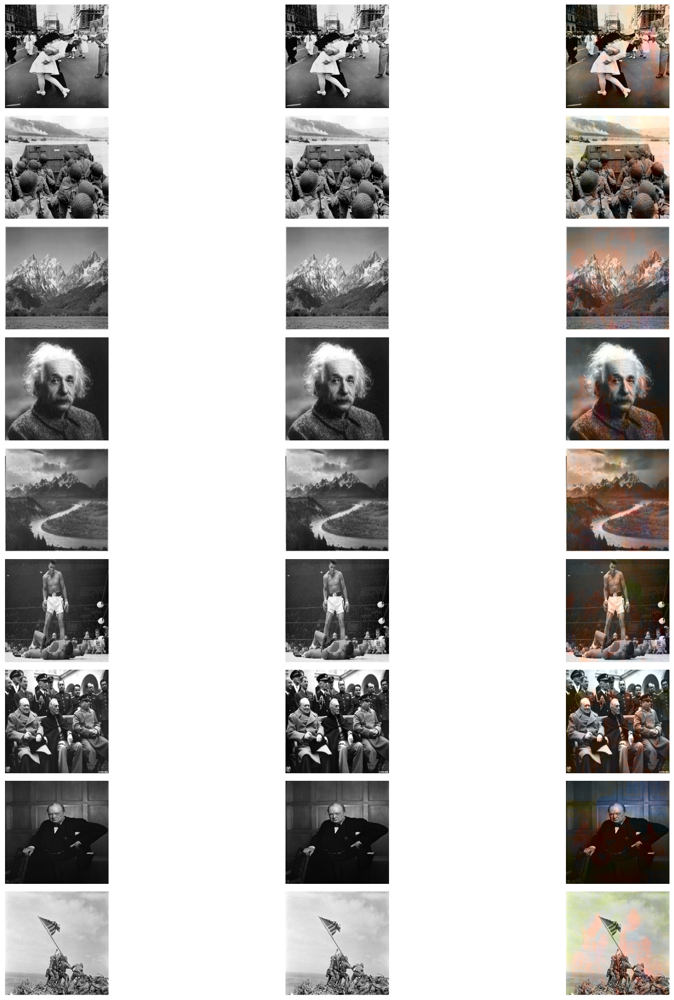

In [33]:
visualize_predictions(data, predictions, 1, 224, 224, index_map)

Looking at the results of this model, we are not satisfied. The predictions on the historical images were very poor, regardless of the temperature we chose. The predictions on the images of the People dataset were instead quite satisfactory, although not superior to the ones obetained with the MSE model trained on the same dataset. <br>
We have also noticed that changing the temperature of the distribution has not had any particular impact on the colorization quality, which was again quite disappointing. <br>
We believe that this has happened because we did not train on enough images, so the model does not generalize well. Furthermore, we did not even have the change to finetune it, since it was too computationally expensive. Nonetheless, the few test images coming from the People dataset yielded good results, with images which could perhaps be perceived as being real photos.